### Installs

In [1]:
!pip install -qq protobuf==3.20.3 # required for tensorflow for some reason
!pip install -Uqq tensorboard-plugin-profile cloud-tpu-profiler lpips transformers tfrecord wandb

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorboardx 2.6.1 requires protobuf>=4.22.3, but you have protobuf 3.20.3 which is incompatible.
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
elegy 0.8.6 requires wandb<0.13.0,>=0.12.10, but you have wandb 0.15.9 which is incompatible.


In [2]:
# Download Ngrok to tunnel the tensorboard port to an external port
!wget https://bin.equinox.io/c/4VmDzA7iaHb/ngrok-stable-linux-amd64.zip
!unzip -o ngrok-stable-linux-amd64.zip
!rm *.zip
!./ngrok authtoken 2Si4VBDtMGKAZ0f4L8EuoC2yeI7_5A2cZkHjaNTjb6kTyjXiC # you have to make a free NGrok account to get this token

--2023-08-30 02:43:08--  https://bin.equinox.io/c/4VmDzA7iaHb/ngrok-stable-linux-amd64.zip
Resolving bin.equinox.io (bin.equinox.io)... 52.202.168.65, 18.205.222.128, 54.161.241.46, ...
Connecting to bin.equinox.io (bin.equinox.io)|52.202.168.65|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 13921656 (13M) [application/octet-stream]
Saving to: ‘ngrok-stable-linux-amd64.zip’

ngrok-stable-linux- 100%[===================>]  13.28M  68.1MB/s    in 0.2s    

2023-08-30 02:43:09 (68.1 MB/s) - ‘ngrok-stable-linux-amd64.zip’ saved [13921656/13921656]

Archive:  ngrok-stable-linux-amd64.zip
  inflating: ngrok                   
Authtoken saved to configuration file: /root/.ngrok2/ngrok.yml


In [3]:
import os, gc; gc.collect()
import multiprocessing as mp
pool = mp.Pool(processes = 10)
results_of_processes = [pool.apply_async(os.system, args=(cmd, ), callback = None )
                        for cmd in [
                        f"tensorboard --logdir ./logs/ --host 0.0.0.0 --port 6006 &",
                        "./ngrok http 6006 &"
                        ]]

### Imports

In [4]:
import os, warnings, logging
os.environ['XLA_DOWNCAST_BF16'] = '1'
os.environ['TOKENIZERS_PARALLELISM'] = 'false'

# required for using multiprocessing for some reason - https://github.com/pytorch/xla/blob/master/contrib/kaggle/distributed-pytorch-xla-basics-with-pjrt.ipynb
for env_var in ['TPU_PROCESS_ADDRESSES', 'CLOUD_TPU_TASK_ID']:
    try:
        os.environ.pop(env_var)
    except:
        pass
    
import torch_xla.distributed.xla_multiprocessing as xmp
import torch_xla.distributed.parallel_loader as pl
import torch_xla.experimental.pjrt_backend
import torch_xla.experimental.pjrt as pjrt
import torch_xla.debug.metrics as met
import torch_xla.debug.profiler as xp
import torch_xla.core.xla_model as xm

from transformers import CLIPTokenizerFast as CLIPTokenizer, CLIPTextModel
from tfrecord.torch.dataset import MultiTFRecordDataset
from torch.utils.data import Dataset, DataLoader
from torch.optim.lr_scheduler import LambdaLR
from tfrecord.tools import tfrecord2idx
from torchvision.io import decode_jpeg
from transformers import logging
import torch.distributed as dist
from torch.optim import AdamW
from tqdm.auto import tqdm
from textwrap import wrap
from PIL import Image
import torch.multiprocessing as mp
import matplotlib.pyplot as plt
import torch.nn.functional as F
import torch.nn as nn
import numpy as np
import torch, glob, gc, wandb

try:
    from flash_attn import flash_attn_func
    ENABLE_FLASH_ATTN = ('DISABLE_FLASH' not in os.environ) or (os.environ['DISABLE_FLASH'] != '1')
except:
    ENABLE_FLASH_ATTN = False

DEBUG = False
USE_WANDB = True
ONE_CORE = False

if USE_WANDB:
    from kaggle_secrets import UserSecretsClient
    user_secrets = UserSecretsClient()
    #wab_key = user_secrets.get_secret("wab_key")
    wab_key = 'b197b6dc0ef1b552165d2a823e3572b62044cdb8'

    os.environ['WANDB_API_KEY'] = wab_key

/usr/local/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [5]:
! curl -s http://localhost:4040/api/tunnels | python3 -c \
    "import sys, json; print(json.load(sys.stdin)['tunnels'][0]['public_url'])"
# to see profiling, capture a profile from Tensorboard with IP name = localhost:6000

http://12f5-34-75-173-90.ngrok-free.app


D0830 02:43:45.638298586     211 config.cc:119]                        gRPC EXPERIMENT tcp_frame_size_tuning               OFF (default:OFF)
D0830 02:43:45.638337359     211 config.cc:119]                        gRPC EXPERIMENT tcp_rcv_lowat                       OFF (default:OFF)
D0830 02:43:45.638341101     211 config.cc:119]                        gRPC EXPERIMENT peer_state_based_framing            OFF (default:OFF)
D0830 02:43:45.638343987     211 config.cc:119]                        gRPC EXPERIMENT flow_control_fixes                  ON  (default:ON)
D0830 02:43:45.638346742     211 config.cc:119]                        gRPC EXPERIMENT memory_pressure_controller          OFF (default:OFF)
D0830 02:43:45.638349699     211 config.cc:119]                        gRPC EXPERIMENT unconstrained_max_quota_buffer_size OFF (default:OFF)
D0830 02:43:45.638352263     211 config.cc:119]                        gRPC EXPERIMENT new_hpack_huffman_decoder           ON  (default:ON)
D0830 02:43:45.

### Hyperparameters

In [6]:
EPOCHS = 1250
STEPS_PER_EPOCH = 2048
CROP_SIZE = 256
BATCH_SIZE = 128 # per device batch size
STEPS_PER_LOG = 32
    
TFREC_BASE_DIR = INDEX_BASE_DIR = "/kaggle/input" # where all tfrecord files are found
CHILD_PATTERN = "laion*" # portion of tfrecord filename between the base dirs and the extension which will be found in the tfrecord and tfindex filename

WANDB_RUN_PATH = WANDB_MODEL_FNAME = WANDB_VAE_RUN_PATH = WANDB_VAE_MODEL_FNAME = None
WANDB_RUN_PATH = 'tiewa_enguin/tpu_ldm_ddpm_v2/9ciq4yk5'
WANDB_MODEL_FNAME = 'ddpm_0137.pth'
WANDB_VAE_RUN_PATH = 'tiewa_enguin/tpu_ldm_vae/4za6mkmm'
WANDB_VAE_MODEL_FNAME = 'vae_0003.pth'
CLIP_VERSION = 'openai/clip-vit-large-patch14'
MAX_TOKENS = 64

CKPT_DIR = '/kaggle/working'
# save dirs may be different from load dirs if load dirs are unwritable (e.g. /kaggle/input)
CKPT_SAVE_DIR = '/kaggle/working/checkpoints'

LEARNING_RATE = 1.5e-7 * BATCH_SIZE * 8
LR_WARMUP_STEPS = 10000

VAE_NC = 128
VAE_CH_MULTS = [1, 2, 2, 4]
VAE_NLAYERS_PER_RES = 2
VAE_NZ = DDPM_NZ = 4

DDPM_NC = 256
DDPM_CH_MULTS = [1, 2, 4]
ATTN_RESOLUTIONS = [0, 1, 2]
DDPM_NLAYERS_PER_RES = 2

if DEBUG:
    STEPS_PER_EPOCH = 128
    BATCH_SIZE = 32
    STEPS_PER_LOG = 4
    CLIP_VERSION = 'openai/clip-vit-base-patch32'

    VAE_NC = 32
    VAE_CH_MULTS = [1, 1, 1, 1]
    VAE_NLAYERS_PER_RES = 1
    VAE_NZ = DDPM_NZ = 4
    
    DDPM_NC = 32
    DDPM_CH_MULTS = [1, 1, 1]
    ATTN_RESOLUTIONS = [0, 0, 0]
    DDPM_NLAYERS_PER_RES = 1

TEXT_CONTEXT_DIM = 768 if 'large' in CLIP_VERSION else 512

### Dataset

In [7]:
join = os.path.join

INDEX_PATTERN = join(INDEX_BASE_DIR, "{}.tfindex")
ff_unpruned = glob.glob(join(TFREC_BASE_DIR, CHILD_PATTERN, '*.tfrecord'))
ff = []
for f in ff_unpruned:
    if os.path.getsize(f) > 100e6: # greater than 100 MB:
        ff.append(f)
n_files = len(ff)

FF_CHILD = []
for f in ff:
    child = os.path.splitext(f[len(TFREC_BASE_DIR)+1:])[0] # get rid of base dir and ext
    FF_CHILD.append(child) # child is the common part of filename between tfrecord and tfindex file

TFREC_PATTERN = join(TFREC_BASE_DIR, '{}.tfrecord')

def process_ex(example):
    bytes_arr = torch.tensor(np.frombuffer(example['jpg'], dtype=np.uint8))
    image = decode_jpeg(bytes_arr).float() / 127.5 - 1.0
    if image.shape[0] == 1:
        image = image.repeat([3, 1, 1])
    caption = example['txt'].decode('utf-8')
    return image, caption

### Layers

Residual Block

In [8]:
def zero_module(module):
    for p in module.parameters():
        p.detach().zero_()
    return module

class ResBlock(nn.Module):
    def __init__(self, in_c: int, nc: int, temb_c: int = None):
        '''
        in_c: number of input channels
        nc: number of output channels
        temb_c: number of t (time?) embedding input channels (or None if no time embedding)
        '''
        super().__init__()
        self.norm1 = nn.GroupNorm(32, in_c)
        self.act1 = nn.SiLU()
        self.conv1 = nn.Conv2d(in_c, nc, 3, padding=1)
        self.norm2 = nn.GroupNorm(32, nc)
        self.act2 = nn.SiLU()
        self.conv2 = zero_module(nn.Conv2d(nc, nc, 3, padding=1))
        if temb_c is not None:
            self.temb_proj = nn.Linear(temb_c, nc)
        self.skip = nn.Conv2d(in_c, nc, 1) if in_c != nc else None
    
    def forward(self, x, temb=None): # temb = t (time) embedding
        skip = x if self.skip is None else self.skip(x)
        x = self.conv1(self.act1(self.norm1(x)))
        if temb is not None:
            x = x + self.temb_proj(F.silu(temb))[:, :, None, None]
        x = self.conv2(self.act2(self.norm2(x)))
        
        return x + skip

Down/Upsample

In [9]:
class Downsample(nn.Module):
    def __init__(self, nc: int):
        '''
        nc: number of input and output channels
        '''
        super().__init__()
        self.layer = nn.Sequential(nn.ZeroPad2d((0, 1, 0, 1)), nn.Conv2d(nc, nc, 3, 2))

    def forward(self, x):
        return self.layer(x)

class Upsample(nn.Module):
    def __init__(self, nc: int):
        '''
        nc: number of input and output channels
        '''
        super().__init__()
        self.conv = nn.Conv2d(nc, nc, 3, padding=1)

    def forward(self, x):
        _B, _C, H, W = x.shape
        return self.conv(F.interpolate(x, size=(H*2, W*2), mode='nearest')) # specifying scale factor offloads op to CPU: https://github.com/pytorch/xla/issues/2588

2D Attention

In [10]:
class MHA(nn.Module): # slightly faster and less mem than torch multihead attn (I suppose from QKV projection being fused)
    def __init__(self, nc: int, nh: int, kv_dim: int = None, zero_last_layer: bool = True):
        '''
        nc: number of input and output channels
        nh: number of heads (note: d_head = nc // nh)
        kv_dim: dimensionality of key & value input (used for conditioning input in cross-attention; self-attention if kv_dim is None)
        zero_last_layer: whether or not to zero-init the weights of the last layer (this helps out optimization of residual connections)
        '''
        super().__init__()
        self.nh = nh
        self.dhead = nc // nh
        
        kv_dim = nc if kv_dim is None else kv_dim
        self.q_in = nn.Linear(nc, nc, bias=False)
        self.k_in = nn.Linear(kv_dim, nc, bias=False)
        self.v_in = nn.Linear(kv_dim, nc, bias=False)
        self.out = nn.Linear(nc, nc, bias=False)
        if zero_last_layer:
            self.out = zero_module(self.out)
    
    def split_heads(self, x):
        B, L, E = x.shape
        if ENABLE_FLASH_ATTN:
            return x.reshape(B, L, self.nh, self.dhead) # M N (H D) -> M N H D, D=self.dhead, H=self.nh)
        return x.reshape(B, L, self.nh, self.dhead).permute(0, 2, 1, 3).contiguous() # M N (H D) -> M H N D, D=self.dhead, H=self.nh
    
    def forward(self, q, kv=None):
        B, L, E = q.shape
        if kv is None:
            q, k, v = map(self.split_heads, (self.q_in(q), self.k_in(q), self.v_in(q)))
        else:
            q, k, v = map(self.split_heads, (self.q_in(q), self.k_in(kv), self.v_in(kv)))

        if ENABLE_FLASH_ATTN:
            qkv = flash_attn_func(q, k, v) # flash attention not on TPU
            concatted = qkv.reshape(B, L, E) # M N H D -> M N (H D)
        else:
            qkv = F.scaled_dot_product_attention(q, k, v) # flash attention not on TPU
            concatted = qkv.permute(0, 2, 1, 3).reshape(B, L, E).contiguous() # M H N D -> M N (H D)
        return self.out(concatted)
    
class Attn2d(nn.Module):
    def __init__(self, nc: int):
        '''
        nc: number of input and output channels
        '''
        super().__init__()
        self.nc = nc
        self.norm = nn.GroupNorm(32, self.nc)
        self.attn = MHA(self.nc, max(self.nc // 128, 1)) # max head dim is 128

    def forward(self, x):
        B, C, H, W = x.shape
        h = self.norm(x).reshape(B, C, H*W).permute(0, 2, 1) # B C H W -> B (H W) C
        h = self.attn(h)
        h = h.permute(0, 2, 1).reshape(B, C, H, W) # B (H W) C -> B C H W
        return x + h

Transformer Block

In [11]:
class SwiGLU(nn.Module):
    def __init__(self, in_c: int, nc: int, bias: bool = False):
        super().__init__()
        self.lin = nn.Linear(in_c, nc, bias=bias)
        self.gate = nn.Linear(in_c, nc, bias=bias)

    def forward(self, x):
        return self.lin(x) * F.silu(self.gate(x))

class TransformerBlock(nn.Module):
    '''
    Attention between UNet feature maps and text embeddings.
    '''
    def __init__(self, d: int, d_emb: int, nh: int = 8):
        '''
        d: attention dimensionality
        d_emb: dimensionality of conditioning embedding (text conditioning)
        nh: number of heads
        '''
        super().__init__()
        self.norm1 = nn.LayerNorm(d)
        self.norm2 = nn.LayerNorm(d)
        self.norm3 = nn.LayerNorm(d)
        self.attn1 = MHA(d, nh)
        self.attn2 = MHA(d, nh, kv_dim=d_emb)
        self.ff = nn.Sequential(
            SwiGLU(d, 4*d, bias=False),
            zero_module(nn.Linear(4*d, d, bias=False)),
        )
        self.proj_out = zero_module(nn.Linear(d, d, bias=False))

    def forward(self, x, context=None):
        B, C, H, W = x.shape
        skip = x
        x = x.reshape(B, C, H*W).permute(0, 2, 1).contiguous() # B C H W -> B (H W) C
        x = self.attn1(self.norm1(x)) + x
        if context is not None:
            x = self.attn2(self.norm2(x), context) + x
        x = self.proj_out(self.ff(self.norm3(x)) + x)
        x = x.permute(0, 2, 1).reshape(B, C, H, W).contiguous() # B (H W) C -> B C H W

        return x + skip

### Models

VAE

In [12]:
class VAEEncoder(nn.Module):
    def __init__(self,
            nc: int,
            ch_mults: tuple,
            nlayers_per_res: int,
            nz: int
            ):
        '''
        nc: base number of channels
        ch_mults: channel multiplier per resolution
        nz: number of latent output channels
        '''
        super().__init__()
        # put input args as class fields
        locals_ = locals().copy()
        locals_.pop('self')
        for k, v in locals_.items():
            setattr(self, k, v)

        layers = [nn.Conv2d(3, nc, 3, padding=1)]
        out_c = nc

        for layer_idx, ch_mult in enumerate(ch_mults):
            in_c, out_c = out_c, nc * ch_mult
            layers += [ResBlock(in_c, out_c)] + [ResBlock(out_c, out_c) for _ in range(nlayers_per_res-1)]
            if layer_idx != len(ch_mults) - 1:
                layers.append(Downsample(out_c))

        layers += [ 
            # mid
            ResBlock(out_c, out_c),
            Attn2d(out_c),
            ResBlock(out_c, out_c),

            # out
            nn.GroupNorm(32, out_c),
            nn.SiLU(),
            nn.Conv2d(out_c, 2*nz, 3, padding=1),
        ]

        self.model = nn.Sequential(*layers)
    
    def forward(self, x):
        x = self.model(x) # nz*2 for the mean, stdev
        return x

class VAEDecoder(nn.Module):
    def __init__(self,
            nc: int,
            ch_mults: tuple,
            nlayers_per_res: int,
            nz: int
            ):
        '''
        nc: base number of channels
        ch_mults: channel multiplier per resolution
        nz: number of latent output channels
        '''
        super().__init__()
        # put input args as class fields
        locals_ = locals().copy()
        locals_.pop('self')
        for k, v in locals_.items():
            setattr(self, k, v)

        out_c = self.nc * self.ch_mults[-1] 
        layers = [
            nn.Conv2d(nz, out_c, 3, padding=1),
            ResBlock(out_c, out_c),
            Attn2d(out_c),
            ResBlock(out_c, out_c),
        ]

        for layer_idx, ch_mult in enumerate(reversed(ch_mults)):
            in_c, out_c = out_c, self.nc * ch_mult
            layers += [ResBlock(in_c, out_c)] + [ResBlock(out_c, out_c) for _ in range(nlayers_per_res-1)]
            if layer_idx != 0:
                layers.append(Upsample(out_c))

        layers += [
            nn.GroupNorm(32, out_c),
            nn.SiLU(),
            nn.Conv2d(out_c, 3, 3, padding=1)
        ]

        self.model = nn.Sequential(*layers)
    
    def forward(self, x):
        return self.model(x)
    
class VAE(nn.Module):
    def __init__(
        self,
        nc: int = VAE_NC,
        ch_mults: list = VAE_CH_MULTS,
        nlayers_per_res: int = VAE_NLAYERS_PER_RES,
        nz: int = VAE_NZ
    ):
        super().__init__()
        # put input args as class fields
        locals_ = locals().copy()
        locals_.pop('self')
        for k, v in locals_.items():
            setattr(self, k, v)

        self.encoder = VAEEncoder(nc=self.nc, ch_mults=self.ch_mults, nlayers_per_res=self.nlayers_per_res, nz=self.nz)
        self.decoder = VAEDecoder(nc=self.nc, ch_mults=self.ch_mults, nlayers_per_res=self.nlayers_per_res, nz=self.nz)

    def forward(self, x):
        z_params = self.encoder(x)
        mean, log_var = torch.split(z_params, self.nz, dim=1)
        z = self.sample(mean, log_var)
        out = self.decoder(z)
        return out, mean, log_var

    def sample(self, mean, log_var):
        std = torch.exp(0.5 * log_var)
        eps = torch.randn_like(log_var)
        return mean + eps * std

CLIP Text Embedder

In [13]:
class FrozenCLIPEmbedder(nn.Module):
    """Uses the CLIP transformer encoder for text (from Hugging Face)"""
    def __init__(self, version=CLIP_VERSION, max_length=MAX_TOKENS):
        super().__init__()
        self.tokenizer = CLIPTokenizer.from_pretrained(version)
        self.transformer = CLIPTextModel.from_pretrained(version)
        self.device = 'cpu'
        self.max_length = max_length
        self.freeze()
    
    def to(self, device):
        self.device = device
        return super().to(device)

    def freeze(self):
        self.transformer = self.transformer.eval()
        for param in self.parameters():
            param.requires_grad = False

    def forward(self, text=None, tokens=None):
        assert not (tokens is None and text is None)
        if tokens is None:
            batch_encoding = self.tokenizer(text, truncation=True, max_length=self.max_length, return_length=True,
                                            return_overflowing_tokens=False, padding="max_length", return_tensors="pt")
            tokens = batch_encoding["input_ids"].to(self.device)
        outputs = self.transformer(input_ids=tokens)

        z = outputs.last_hidden_state
        return z

Sequential Timestep Embedding

In [14]:
class TimestepEmbedSequential(nn.Sequential):
    '''
    A sequential module that passes timestep embeddings to the children that
    support it as an extra input.
    '''
    def forward(self, x, emb, context=None):
        for layer in self:
            if isinstance(layer, ResBlock):
                x = layer(x, emb)
            elif isinstance(layer, TransformerBlock):
                x = layer(x, context)
            else:
                x = layer(x)
        return x

UNet

In [15]:
class UNet(nn.Module):
    def __init__(self,
        in_c: int = DDPM_NZ,
        nc: int = DDPM_NC,
        ch_mults: list = DDPM_CH_MULTS,
        attn_resolutions: list = ATTN_RESOLUTIONS,
        nlayers_per_res: int = DDPM_NLAYERS_PER_RES,
        context_dim: int = TEXT_CONTEXT_DIM,
    ):
        super().__init__()
        # put input args as class fields
        locals_ = locals().copy()
        locals_.pop('self')
        for k, v in locals_.items():
            setattr(self, k, v)

        temb_c = nc * 4
        self.time_embed = nn.Embedding(1000, temb_c)

        # adding downsampling blocks
        out_c = nc
        self.downs = nn.ModuleList([TimestepEmbedSequential(nn.Conv2d(in_c, nc, 3, padding=1))])
        down_out_cs = [nc] # output channel counts of the downsampling activation stack
        for block_idx, ch_mult in enumerate(ch_mults):
            for n_idx in range(nlayers_per_res):
                in_c, out_c = out_c, nc * ch_mult

                block = [ResBlock(in_c, out_c, temb_c)] + [TransformerBlock(out_c, context_dim) for _ in range(attn_resolutions[block_idx])]
                block = TimestepEmbedSequential(*block)
                self.downs.append(block)
                down_out_cs.append(out_c)

            if block_idx != len(ch_mults) - 1:
                self.downs.append(TimestepEmbedSequential(Downsample(out_c)))
                down_out_cs.append(out_c)

        # middle block
        self.mid_block = TimestepEmbedSequential(
            ResBlock(out_c, out_c, temb_c),
            *[TransformerBlock(out_c, context_dim) for _ in range(attn_resolutions[-1])],
            ResBlock(out_c, out_c, temb_c),
        )
    
        # adding upsampling blocks
        self.ups = nn.ModuleList([])
        for block_idx, ch_mult in enumerate(reversed(ch_mults)):
            for n_idx in range(nlayers_per_res+1):
                down_c = down_out_cs.pop()
                in_c, out_c = out_c + down_c, nc * ch_mult

                block = [ResBlock(in_c, out_c, temb_c)] + [TransformerBlock(out_c, context_dim) for _ in range(attn_resolutions[-block_idx-1])]

                if n_idx == nlayers_per_res and block_idx != len(ch_mults)-1:
                    block.append(Upsample(out_c))

                block = TimestepEmbedSequential(*block)
                self.ups.append(block)

        self.out = nn.Sequential(
            nn.GroupNorm(32, nc),
            nn.SiLU(),
            nn.Conv2d(nc, self.in_c, 3, padding=1)
        )

    def forward(self, x, timesteps, context=None):
        temb = self.time_embed(timesteps)
        downs = []
        for block in self.downs:
            x = block(x, temb, context)
            downs.append(x)
        x = self.mid_block(x, temb, context)
        for block in self.ups:
            x = torch.cat([x, downs.pop()], dim=1)
            x = block(x, temb, context)
        x = self.out(x)

        return x

### Samplers

Noise Schedule

In [23]:
class NoiseSchedule(nn.Module):
    def __init__(self, t=1000, beta_min=8.5e-4, beta_max=1.2e-2):
        super().__init__()
        self.t = torch.ones((), dtype=torch.int) * t
        self.beta_min = beta_min
        self.beta_max = beta_max
        self.register_buffer('betas', torch.linspace(beta_min**0.5, beta_max**0.5, t, dtype=torch.double) ** 2)
        self.register_buffer('alphas', 1 - self.betas)
        self.register_buffer('alpha_prods', torch.cumprod(self.alphas, dim=0))
        self.register_buffer('signal_stds', self.alpha_prods.sqrt())
        self.register_buffer('noise_stds', (1 - self.alpha_prods).sqrt())

    def forward(self, x):
        # noises each sample in x to a random timestep 
        B = x.shape[0]
        noise = torch.randn_like(x)
        timesteps = torch.randint(self.t, (B,), device=x.device)
        noised = self.signal_stds[timesteps][:, None, None, None] * x.double() + self.noise_stds[timesteps][:, None, None, None] * noise.double()
        return noised.float(), timesteps.long(), noise

DDIM Sampler

In [17]:
class DDIMSampler():
    def __init__(self, denoiser,
            noise_schedule=NoiseSchedule(),
            tau_dim=None,
            eta=0.0,
        ):
        device = noise_schedule.alpha_prods.device
        self.denoiser = denoiser
        self.noise_schedule = noise_schedule
        self.tau_dim = noise_schedule.t if tau_dim is None else tau_dim
        self.tau = np.linspace(0, self.noise_schedule.t-1, self.tau_dim).astype(np.int32)
        self.eta = torch.ones((), device=device, dtype=torch.double) * eta

        self.alphas = torch.cat([torch.ones((1,), dtype=torch.double).to(device), self.noise_schedule.alpha_prods[self.tau]])
        self.betas = 1 - self.alphas

    def denoise_step(self, x, t, noise_pred):
        beta_ratio = self.betas[t-1] / self.betas[t]
        alpha_ratio = self.alphas[t] / self.alphas[t-1]
        sigma = self.eta * (beta_ratio * (1 - alpha_ratio))**0.5
        x0_step = self.alphas[t]**-0.5 * (x - self.betas[t]**0.5 * noise_pred)
        xt_step = (1 - self.alphas[t-1] - sigma**2)**0.5 * noise_pred
        added_noise = sigma * torch.randn_like(x)
        return self.alphas[t-1]**0.5 * x0_step + xt_step + added_noise

    def get_samples(self, initial_x=None, x_shape=None, context=None, verbose=True, cfg_weight=5):
        if initial_x is None and x_shape is None:
            raise Exception('Either initial_x or x_shape must be defined.')

        x = torch.randn(x_shape, dtype=torch.double) if initial_x is None else initial_x.double()
        for t in tqdm(range(self.tau_dim, 0, -1)):
            t = torch.Tensor((t,)).long().to(x.device)
            t_repeated = self.tau[t-1] * torch.ones(x.shape[:1], dtype=int).to(x.device)
            if cfg_weight in (0, None):
                noise_pred = self.denoiser(x.float(), t_repeated, context).double()
            else:
                noise_pred = (1 + cfg_weight) * self.denoiser(x.float(), t_repeated, context).double() - cfg_weight * self.denoiser(x.float(), t_repeated, torch.zeros_like(context)).double()
            x = self.denoise_step(x, t, noise_pred)
            xm.mark_step()
        return x.float()

Loading Models

In [18]:
def load_models(device='cpu', lr=1e-4, lr_warmup_steps=4000, ckpt_path=None, vae_ckpt_path=None):
    ddpm = UNet().to(device)
    vae = VAE().eval().to(device)
    for param in vae.parameters():
        param.requires_grad = False
        
    text_embedder = FrozenCLIPEmbedder().to(device)
    text_embedder.transformer = torch.compile(text_embedder.transformer, backend='torchxla_trace_once')
    noise_schedule = NoiseSchedule().to(device)
    sampler = DDIMSampler(ddpm, noise_schedule=noise_schedule, tau_dim=200)
    opt = AdamW(ddpm.parameters(), lr)
    lr_warmup_steps = lr_warmup_steps // STEPS_PER_LOG
    scheduler = LambdaLR(
        opt,
        lambda step: min(step, lr_warmup_steps)*(1-1e-6)/lr_warmup_steps + 1e-6
    )
    
    epoch = 0
    global_step = 0

    if vae_ckpt_path is not None:
        xm.master_print(f'Loading VAE checkpoint from {vae_ckpt_path}')
        vae_ckpt = torch.load(vae_ckpt_path, map_location=torch.device('cpu'))
        vae.load_state_dict(vae_ckpt['vae_state_dict'])

    if ckpt_path is not None:
        xm.master_print(f'Loading checkpoint from {ckpt_path}')
        ckpt = torch.load(ckpt_path, map_location=torch.device('cpu'))
        ddpm.load_state_dict(ckpt['ddpm_state_dict'])
        ddpm = ddpm.to(device)
        opt = AdamW(ddpm.parameters(), lr)
        opt.load_state_dict(ckpt['opt_state_dict'])
        scheduler.load_state_dict(ckpt['scheduler_state_dict'])
        epoch = ckpt['epoch']
        global_step = ckpt['global_step']

    return {
            'ddpm': ddpm, 'vae': vae, 'text_embedder': text_embedder,
            'noise_schedule': noise_schedule, 'sampler': sampler,
            'opt': opt, 'scheduler': scheduler,
            'epoch': epoch, 'global_step': global_step
            }

### Trainer

In [24]:
class DDPMTrainer:
    def __init__(
        self,
        ddpm, vae, text_embedder,
        noise_schedule, sampler,
        loader,
        opt, scheduler,
        img_size, ckpt_save_dir,
        wandb_run, device,
        global_step=0,
    ):
        # put input args as class fields
        locals_ = locals().copy()
        locals_.pop('self')
        for k, v in locals_.items():
            setattr(self, k, v)
        self.p_uncond = 0.1
        self.z_std = None
        self.model_fnames = []

        vae_downscale_factor = int(2 ** (len(self.vae.ch_mults) - 1))
        if isinstance(img_size, int):
            z_spatial = img_size // vae_downscale_factor
            self.z_shape = (self.vae.nz, z_spatial, z_spatial)
        else:
            z_h = img_size[0] // vae_downscale_factor
            z_w = img_size[1] // vae_downscale_factor
            self.z_shape = (self.vae.nz, z_h, z_w)
            
    def display_predictions(self, n_rows=2, n_cols=4,
            captions=None, display=True, save_path=None):
        n_imgs = n_rows * n_cols
        if not xm.is_master_ordinal():
            return
        
        if captions is None:
            # get random captions from the training dataset
            captions = next(iter(self.loader))[1][:n_imgs]
        text_embeddings = self.text_embedder(captions)

        z = torch.randn((n_imgs, *self.z_shape), device=self.device)

        with torch.no_grad():
            z_std = 1 if self.z_std is None else self.z_std
            z_denoised = self.sampler.get_samples(initial_x=z, context=text_embeddings) * z_std
            preds = self.vae.decoder(z_denoised)

        preds = preds.permute(0, 2, 3, 1).detach().float().cpu().clamp(-1, 1) * 0.5 + 0.5
        fig, ax = plt.subplots(n_rows, n_cols, figsize=(20, 12))
        
        word_wrap = lambda text: '\n'.join(wrap(text, 30))

        for i in range(n_imgs):
            row, col = i // n_cols, i % n_cols
            ax[row][col].title.set_text(word_wrap(captions[i]))
            ax[row][col].imshow(preds[i])

        if save_path is not None:
            os.makedirs(os.path.dirname(save_path), exist_ok=True)
            fig.savefig(save_path)

        if self.wandb_run is not None:
            wandb.log({'preds': wandb.Image(fig)})

        if display:
            plt.show()

        plt.close('all')

    def save_models(self, epoch=0, remove_after_save=True):
        ckpt_save_path = f'{self.ckpt_save_dir}/ddpm_{epoch:0>4}.pth'
        xm.mark_step()
        xm.save({
            'ddpm_state_dict': self.ddpm.state_dict(),
            'opt_state_dict': self.opt.state_dict(),
            'scheduler_state_dict': self.scheduler.state_dict(),
            'epoch': epoch,
            'global_step': self.global_step,
            'z_std': self.z_std
            }, ckpt_save_path)

        if self.wandb_run is not None:
            wandb.save(ckpt_save_path)
            self.model_fnames.append(ckpt_save_path)
            if remove_after_save and len(self.model_fnames) >= 2:
                os.remove(self.model_fnames.pop(0))

    def train_step(self, imgs, captions):
        self.opt.zero_grad()
        
        text_embeddings = self.text_embedder(captions)
        cond_mask = torch.where(torch.rand((text_embeddings.shape[0], 1, 1), device=self.device) < self.p_uncond, 0.0, 1.0)
        text_embeddings = text_embeddings * cond_mask

        with xp.Trace('enc'):
            z_params = self.vae.encoder(imgs)
            mean, log_var = torch.split(z_params, self.vae.nz, dim=1)
            z = self.vae.sample(mean, log_var)
            if self.z_std is None:
                self.z_std = xm.all_reduce('sum', z.std(), scale=0.125).detach()
            z = z / self.z_std

        with xp.Trace('noise'):
            noised, timesteps, noise = self.noise_schedule(z)
            
        with xp.Trace('forward'):
            noise_preds = self.ddpm(noised.detach(), timesteps.detach(), text_embeddings.detach())
            loss = F.mse_loss(noise_preds, noise)
            
        with xp.Trace('backward'):
            loss.backward()
        
        with xp.Trace('opt_step'):
            xm.optimizer_step(self.opt)
        
        return {'noise_loss': loss}
    
    def log_step(self,
        log_metrics: dict, step: int,
        epoch: int, epochs: int, steps_per_epoch: int, pbar
    ):
        self.scheduler.step()
        log_items = {k: xm.mesh_reduce('sum', v.item(), lambda vals: sum(vals) / 8) for k, v in log_metrics.items()} # .item() must be executed out of is_master_ordinal() or will hang
        if xm.is_master_ordinal():
            pbar.update(STEPS_PER_LOG)
            pbar.set_description(f'Epoch {epoch+1}/{epochs}, {(step+1) % steps_per_epoch}/{steps_per_epoch}')
            
            if self.wandb_run is not None:
                wandb.log(log_items, step=self.global_step)

    def train_loop(self, epochs=1, steps_per_epoch=-1,
            save_every_n_epochs=1, epoch=0,
            global_step=0):
        loader = pl.MpDeviceLoader(self.loader, self.device)
        gc.collect()
        pbar = tqdm(total=steps_per_epoch) if xm.is_master_ordinal() else None
        for step, (imgs, captions) in enumerate(loader):
            log_metrics = self.train_step(imgs, captions)

            if (step + 1) % STEPS_PER_LOG == 0:
                self.global_step += STEPS_PER_LOG
                xm.add_step_closure(self.log_step, args=(
                    log_metrics, step,
                    epoch, epochs, steps_per_epoch, pbar
                ))
                
            if (step + 1) % steps_per_epoch == 0:
                epoch += 1
                if epoch % save_every_n_epochs == 0:
                    xm.add_step_closure(self.save_models, args=(epoch,))
                    xm.add_step_closure(self.display_predictions, args=(2, 4, None, True, f'predictions/out_{epoch:0>4}.jpg',))
                if xm.is_master_ordinal():
                    pbar.close()
                    pbar = tqdm(total=steps_per_epoch)
                if epoch == epochs:
                    break

Train Function

In [25]:
def train(
    rank: int, seeds: list,
    epochs: int, steps_per_epoch: int,
    crop_size: int, batch_size: int,
    learning_rate: float, lr_warmup_steps: int,
    ckpt_save_dir: str, ckpt_path: str = None,
    vae_ckpt_path: str = None,
):
    device = xm.xla_device()
    server = xp.start_server(6000)
    dist.init_process_group('xla', init_method='pjrt://')
    
    xm.set_rng_state(seeds[rank])
    np.random.seed(seeds[rank])
    
    n_devices = 8
    s_i = rank * len(FF_CHILD) // n_devices
    e_i = len(FF_CHILD) if rank == n_devices - 1 else (rank + 1) * len(FF_CHILD) // n_devices
    splits = {
        f: 1 / (e_i - s_i) for f in FF_CHILD[s_i:e_i] # uniform sampling
    }
    dataset = MultiTFRecordDataset(TFREC_PATTERN, INDEX_PATTERN, splits, transform=process_ex)
    loader = DataLoader(dataset, batch_size=batch_size)
    
    loaded = load_models(
            device=device, lr=learning_rate, lr_warmup_steps=lr_warmup_steps,
            ckpt_path=ckpt_path, vae_ckpt_path=vae_ckpt_path)
    ddpm, vae, text_embedder = loaded['ddpm'], loaded['vae'], loaded['text_embedder']
    noise_schedule, sampler = loaded['noise_schedule'], loaded['sampler']
    opt, scheduler = loaded['opt'], loaded['scheduler']
    epoch, global_step = loaded['epoch'], loaded['global_step']
    
    if global_step == 0:
        pjrt.broadcast_master_param(ddpm)

    wandb_run = None
    if USE_WANDB and rank == 0:
        wandb_run = wandb.init(project='tpu_ldm_ddpm_v2')
        wandb.save('/kaggle/working/train.py')

    trainer = DDPMTrainer(
        ddpm, vae, text_embedder,
        noise_schedule, sampler,
        loader,
        opt, scheduler,
        crop_size, ckpt_save_dir,
        wandb_run, device,
        global_step=global_step,
    )
    
    del ddpm, vae, text_embedder, noise_schedule, opt # these are in the device so can be safely deleted from cpu mem
    gc.collect()

    #if rank == 0 and global_step == 0 and not DEBUG:
    #    trainer.display_predictions(save_path=f'predictions/out_initial.jpg')
    trainer.train_loop(epochs=epochs, steps_per_epoch=steps_per_epoch,
        epoch=epoch, global_step=global_step)

    if USE_WANDB and rank == 0:
        wandb.finish()

In [26]:
!rm /kaggle/working/train.py
%history -f /kaggle/working/train.py -l 17

Run Loop

E0830 02:53:42.117826024    4478 oauth2_credentials.cc:236]            oauth_fetch: UNKNOWN:C-ares status is not ARES_SUCCESS qtype=A name=metadata.google.internal. is_balancer=0: Domain name not found {grpc_status:2, created_time:"2023-08-30T02:53:42.117807264+00:00"}
E0830 02:53:42.117916686    4479 oauth2_credentials.cc:236]            oauth_fetch: UNKNOWN:C-ares status is not ARES_SUCCESS qtype=A name=metadata.google.internal. is_balancer=0: Domain name not found {grpc_status:2, created_time:"2023-08-30T02:53:42.117891304+00:00"}
E0830 02:53:42.117969487    4481 oauth2_credentials.cc:236]            oauth_fetch: UNKNOWN:C-ares status is not ARES_SUCCESS qtype=A name=metadata.google.internal. is_balancer=0: Domain name not found {grpc_status:2, created_time:"2023-08-30T02:53:42.117952803+00:00"}
E0830 02:53:42.118392521    4480 oauth2_credentials.cc:236]            oauth_fetch: UNKNOWN:C-ares status is not ARES_SUCCESS qtype=A name=metadata.google.internal. is_balancer=0: Domain nam

Loading VAE checkpoint from /kaggle/working/vae_0003.pth
Loading checkpoint from /kaggle/working/ddpm_0137.pth


wandb: Currently logged in as: tiewa_enguin. Use `wandb login --relogin` to force relogin


wandb: WARNING Saving files without folders. If you want to preserve sub directories pass base_path to wandb.save, i.e. wandb.save("/mnt/folder/file.h5", base_path="/mnt")
  0%|          | 0/2048 [00:00<?, ?it/s]

rank z_std: 1.1953125, z_std: 1.203125


Epoch 138/1250, 160/2048:   8%|▊         | 160/2048 [24:05<2:42:04,  5.15s/it]W0830 03:18:35.645977 137071985415872 security_validator.py:60] In 3.0, this warning will become an error:
Illegal Content-Security-Policy for script-src: 'unsafe-inline'
Illegal Content-Security-Policy for script-src-elem: 'unsafe-inline'
W0830 03:18:50.278535 137074969663168 profile_plugin.py:675] ProfilerOptions are available after tensorflow 2.3


Starting to trace for 10000 ms. Remaining attempt(s): 3


W0830 03:19:03.175121 137074969663168 security_validator.py:60] In 3.0, this warning will become an error:
Illegal Content-Security-Policy for script-src: 'unsafe-inline'
Illegal Content-Security-Policy for script-src-elem: 'unsafe-inline'
W0830 03:19:32.130927 137071909914304 security_validator.py:60] In 3.0, this warning will become an error:
Illegal Content-Security-Policy for script-src: 'unsafe-inline'
Illegal Content-Security-Policy for script-src-elem: 'unsafe-inline'
100%|██████████| 200/200 [02:35<00:00,  1.29it/s]


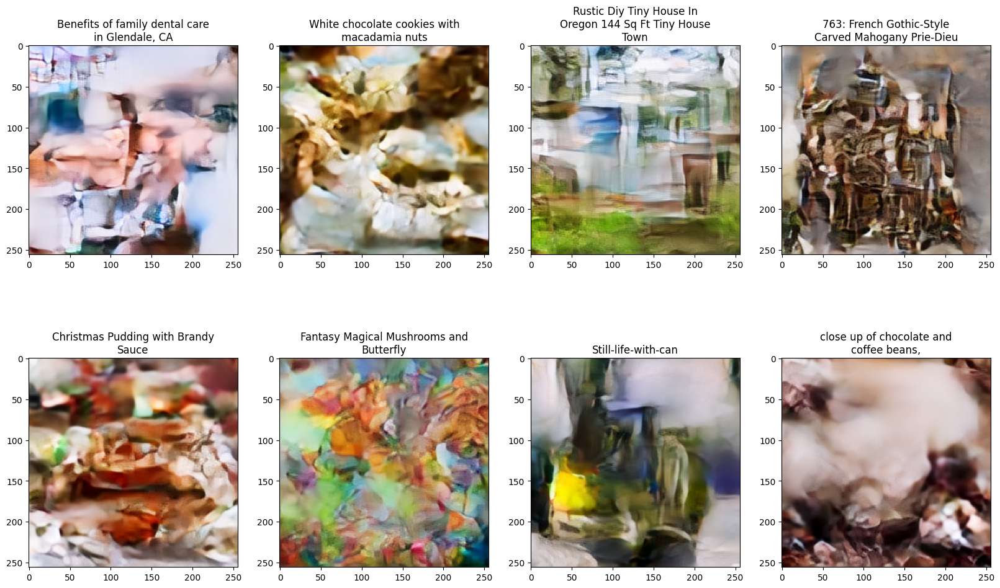

100%|██████████| 200/200 [00:29<00:00,  6.86it/s]


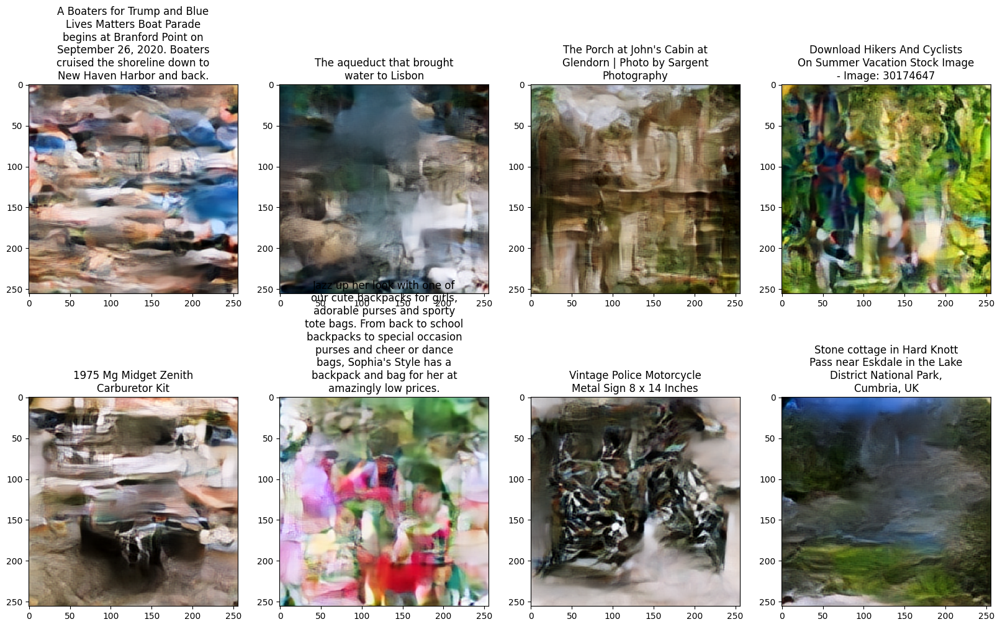

100%|██████████| 200/200 [00:28<00:00,  6.90it/s]


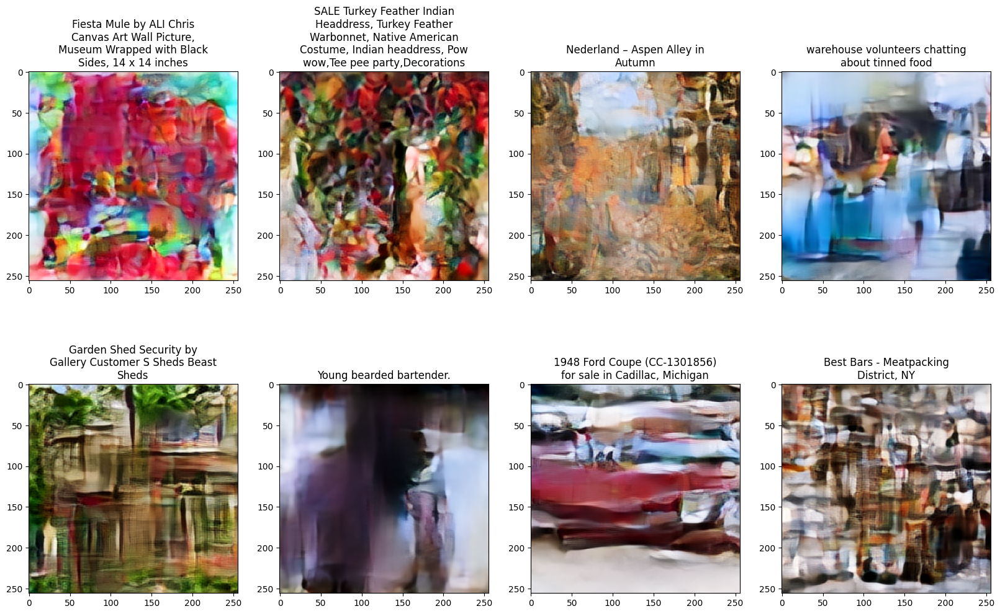

100%|██████████| 200/200 [00:28<00:00,  6.90it/s]


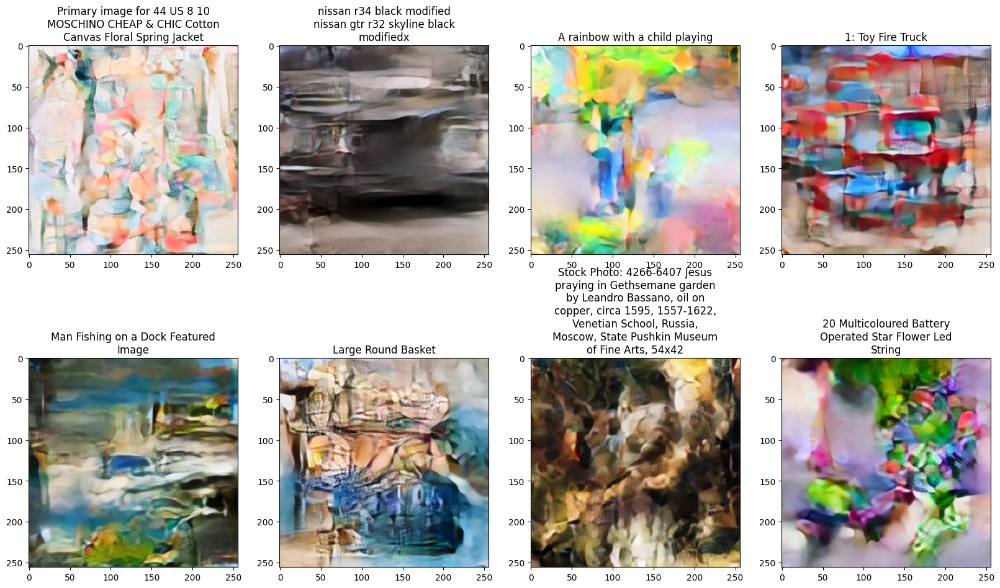

100%|██████████| 200/200 [00:29<00:00,  6.81it/s]


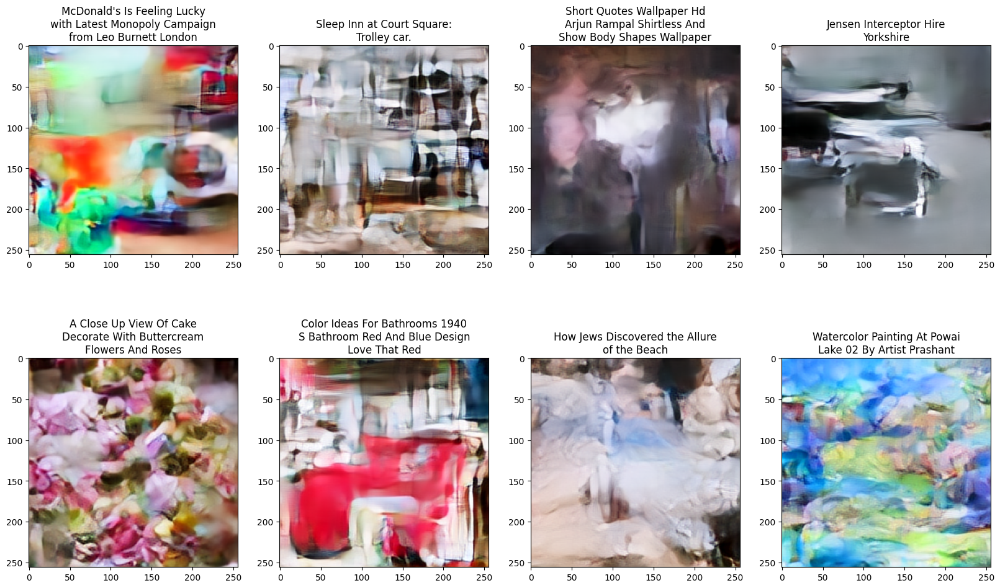

100%|██████████| 200/200 [00:28<00:00,  6.91it/s]


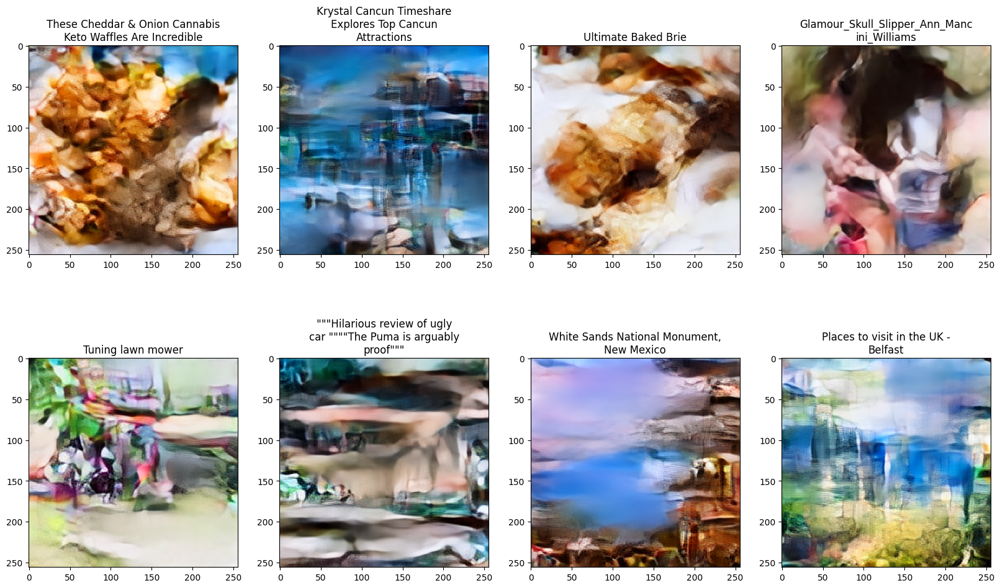

Epoch 144/1250, 1440/2048:  70%|███████   | 1440/2048 [53:31<22:15,  2.20s/it]

In [ ]:
if USE_WANDB and WANDB_RUN_PATH is not None: # load DDPM checkpoint from wandb
    wandb.restore(WANDB_MODEL_FNAME, run_path=WANDB_RUN_PATH, root=CKPT_DIR)
if USE_WANDB and WANDB_VAE_RUN_PATH is not None: # load VAE checkpoint from wandb
    wandb.restore(WANDB_VAE_MODEL_FNAME, run_path=WANDB_VAE_RUN_PATH, root=CKPT_DIR)

FrozenCLIPEmbedder()

# get most recent VAE checkpoint for resuming training
VAE_CKPT_PATH = sorted(glob.glob(f'{CKPT_DIR}/vae_*.pth'))
if VAE_CKPT_PATH != []:
    VAE_CKPT_PATH = VAE_CKPT_PATH[-1]
else:
    VAE_CKPT_PATH = None
    print('Warning: no pretrained VAE found.')

# get most recent DDPM checkpoint for resuming training
CKPT_PATH = sorted(glob.glob(f'{CKPT_DIR}/ddpm_*.pth'))
if CKPT_PATH != []:
    CKPT_PATH = CKPT_PATH[-1]
else:
    CKPT_PATH = None
os.makedirs(CKPT_SAVE_DIR, exist_ok=True)

train_args = (
    torch.randint(0, 2**32, (8,)),
    EPOCHS, STEPS_PER_EPOCH,
    CROP_SIZE, BATCH_SIZE,
    LEARNING_RATE, LR_WARMUP_STEPS,
    CKPT_SAVE_DIR, CKPT_PATH,
    VAE_CKPT_PATH
)

if ONE_CORE:
    train(0, *train_args)
else:
    xmp.spawn(train, args=train_args, start_method='fork')

In [ ]:
!rm -r logs

In [ ]:
wandb.finish()